In [1]:
import math
import sys
import os
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy.table import Table
import matplotlib
from matplotlib import pyplot as plt
import time


sys.path.insert(0, "/global/homes/c/cinlima/gcrcatalogs-new/gcr-catalogs")
sys.path.insert(0, "/global/homes/c/cinlima/")
sys.path.insert(0, "/global/homes/c/cinlima/NumCosmo/notebooks/richness_proxy/MachingCatalogs")


import GCRCatalogs
#Put nersc if using nersc
GCRCatalogs.set_root_dir_by_site("nersc")

print('GCRCatalogs =', GCRCatalogs.__version__, '|' ,'GCR =', GCRCatalogs.GCR.__version__)

from clevar import ClCatalog, MemCatalog
from clevar.match import MembershipMatch, get_matched_pairs

from clevar.match import output_matched_catalog
import clevar

print('Clevar =', clevar.__version__)


# matplotlib.rcParams.update({'font.size': 22})
# matplotlib.rcParams.update({'figure.figsize': (10,8)})


GCRCatalogs = 1.9.0 | GCR = 0.9.2
Clevar = 0.14.1


In [2]:
gc = GCRCatalogs.load_catalog('cosmoDC2_v1.1.4_redmapper_v0.8.1')
gc_truth = GCRCatalogs.load_catalog('cosmoDC2_v1.1.4_image')  

In [3]:
quantities = gc.list_all_quantities()
cluster_quantities = [q for q in quantities if 'member' not in q]
member_quantities = [q for q in quantities if 'member' in q]

In [4]:
# query = GCRCatalogs.GCRQuery('(richness > ' + str(min_richness) +')')   
cluster_data = Table(gc.get_quantities(cluster_quantities))
member_data = Table(gc.get_quantities(member_quantities))

In [5]:
# member_data['pmem']

In [6]:
# min_halo_mass = 1e13 #Msun
# redshift_max = 1.2

# quantities_wanted = ['redshift','halo_mass','halo_id','galaxy_id','ra','dec', 'is_central', 'mag_true_u_lsst', 'mag_true_g_lsst', 'mag_true_r_lsst', 'mag_true_i_lsst', 'mag_true_z_lsst', 'mag_true_y_lsst']

# query = GCRCatalogs.GCRQuery('(halo_mass > ' + str(min_halo_mass) +') & (redshift < ' + str(redshift_max) +')')
# truth_data = Table(gc_truth.get_quantities(quantities_wanted, [query]))
truth_data = Table.read('/global/homes/c/cinlima/NumCosmo/notebooks/richness_proxy/CatalogsMatching/truth_data.fits')

In [13]:
# truth_data

In [7]:
RM_cat_name = 'cosmoDC2_v1.1.4_redmapper_v0.8.1'
DC2_cat_name = 'cosmoDC2_v1.1.4_image'

#Redmapper
RM_cat = ClCatalog(RM_cat_name, z=cluster_data["redshift"], ra=cluster_data["ra"], dec=cluster_data["dec"], id = cluster_data["cluster_id"], richness = cluster_data["richness"], richness_err=cluster_data["richness_err"], \
                   id_cg = cluster_data["id_cen_0"], ztrue_cg=cluster_data["redshift_true_cg"], p_cg_0=cluster_data["p_cen_0"])

pmem = member_data["p_member"] * member_data["pfree_member"] * member_data["theta_i_member"] * member_data["theta_r_member"] 

member_data.add_column(pmem, name="pmem")

RM_cat_members = MemCatalog("RM_members", id_cluster=member_data["cluster_id_member"], id=member_data["id_member"], ra=member_data["ra_member"], dec=member_data["dec_member"],
                            pmem=member_data["pmem"],  redshift=member_data["redshift_true_member"]) 

RM_cat_members = MemCatalog("RM_members", id_cluster=member_data["cluster_id_member"], id=member_data["id_member"], ra=member_data["ra_member"], dec=member_data["dec_member"],
                              redshift=member_data["redshift_true_member"]) 

RM_cat.add_members(members_catalog=RM_cat_members)


#Dc2
halo_cat = ClCatalog(DC2_cat_name, z= truth_data["redshift"][truth_data["is_central"]],
                     ra= truth_data["ra"][truth_data["is_central"]], dec= truth_data["dec"][truth_data["is_central"]],
                     id=truth_data["halo_id"][truth_data["is_central"]], mass_fof=truth_data["halo_mass"][truth_data["is_central"]])

halo_cat_members = MemCatalog("halo_members", id_cluster=truth_data["halo_id"], id=truth_data["galaxy_id"], ra=truth_data["ra"], dec=truth_data["dec"],
                              redshift=truth_data["redshift"], is_central = truth_data["is_central"]) 

halo_cat.add_members(members_catalog=halo_cat_members)

RM_cat._init_match_vals(True)
halo_cat._init_match_vals(True)

/global/homes/c/cinlima/.local/lib/python3.11/site-packages/clevar-0.14.1-py3.11.egg/clevar/catalog/catalog.py:728: UserWarning: Some galaxies were not members of the cluster catalog. They are stored in leftover_members attribute.
  warnings.warn(


In [8]:
RM_cat_name = 'cosmoDC2_v1.1.4_redmapper_v0.8.1'
DC2_cat_name = 'cosmoDC2_v1.1.4_image'

RM_cat = ClCatalog(RM_cat_name, z=cluster_data["redshift"], ra=cluster_data["ra"], dec=cluster_data["dec"], id = cluster_data["cluster_id"], mass = cluster_data["richness"], richness_err=cluster_data["richness_err"], \
                   id_cg = cluster_data["id_cen_0"], ztrue_cg=cluster_data["redshift_true_cg"], p_cg_0=cluster_data["p_cen_0"])



In [9]:
display(RM_cat)

id,z,ra,dec,mass,richness_err,id_cg,ztrue_cg,p_cg_0,mt_self,mt_other,mt_multi_self,mt_multi_other
str11,float32,float64,float64,float32,float32,int64,float32,float32,object,object,object,object
10,0.5135129,52.520436430812914,-25.717996124671657,190.70665,3.7469666,1312945563,0.51072353,0.79138356,None,None,[],[]
18,0.5712697,56.920376528125075,-27.20434071042304,179.12813,3.6934361,2000524808,0.5740297,0.99996513,None,None,[],[]
24,1.040338,56.99849698116052,-26.7172081871169,124.02715,2.4172914,2002535198,1.0347759,0.93527913,None,None,[],[]
30,0.63518524,58.56362402841767,-27.429961828331713,167.33603,3.6777163,2000759779,0.6426174,0.9958548,None,None,[],[]
71,0.44230303,58.35519782866568,-26.867687128773035,111.9147,3.366554,2000289335,0.43919736,0.7297119,None,None,[],[]
73,0.46697217,57.76575707007693,-28.119101936484828,104.439766,2.9570596,2000290819,0.4680865,0.99970347,None,None,[],[]
109,0.4413634,58.509466974185045,-26.989676182075844,103.49396,3.3524604,2000286447,0.44349608,0.99999905,None,None,[],[]
116,1.0629631,54.494027152041674,-27.896589555863095,76.85877,2.2175314,1940324795,1.0758829,0.6544826,None,None,[],[]
133,1.037697,58.137368555958155,-27.199784884537003,75.89771,2.26323,2002528355,1.0311339,0.991116,None,None,[],[]


In [10]:
# RM_cat.write('RM_cat.fits', add_header =True, overwrite=True)

In [13]:
pmem = member_data["p_member"] * member_data["pfree_member"] * member_data["theta_i_member"] * member_data["theta_r_member"] 

# member_data.add_column(pmem, name="pmem")
member_data.replace_column("pmem",pmem) 

In [14]:
RM_cat_members = MemCatalog("RM_members", id_cluster=member_data["cluster_id_member"], id=member_data["id_member"], 
                            ra=member_data["ra_member"], dec=member_data["dec_member"],
                            redshift=member_data["redshift_true_member"]) 
pmem=member_data["pmem"]

RM_cat.add_members(members_catalog=RM_cat_members)

# RM_cat.members.write('RM_cat_members.fits', overwrite=True)


In [15]:
halo_cat = ClCatalog(DC2_cat_name, z= truth_data["redshift"][truth_data["is_central"]],
                     ra= truth_data["ra"][truth_data["is_central"]], dec= truth_data["dec"][truth_data["is_central"]],
                     id=truth_data["halo_id"][truth_data["is_central"]], mass=truth_data["halo_mass"][truth_data["is_central"]])
halo_cat

id,z,ra,dec,mass,mt_self,mt_other,mt_multi_self,mt_multi_other
str21,float64,float64,float64,float64,object,object,object,object
4500151475,0.04818676962281132,49.6366034309591,-40.400894272468605,16891355712901.41,None,None,[],[]
7300151475,0.04825926322238838,50.957598308861314,-41.3447799174979,74621860826501.4,None,None,[],[]
13700151475,0.04554516035339984,51.00887984172898,-40.832338501224754,33506664194163.383,None,None,[],[]
1100151464,0.0643846735498792,50.57641425057562,-41.15855360868742,17911434075583.098,None,None,[],[]
18300151442,0.10736840205357634,50.77601162448169,-39.168679326038024,13042641686354.93,None,None,[],[]
36400151442,0.12743613052494784,50.60510200022939,-39.336294511446724,48388878878287.33,None,None,[],[]
43700151442,0.11375834498747261,49.50475455575477,-40.23977306100707,69213477135143.664,None,None,[],[]
52300151442,0.1259639067546261,51.070122482361214,-39.64548257286864,62974036412214.086,None,None,[],[]
1200151432,0.12775858760889358,50.36982165635327,-39.09754001831282,34125997485791.55,None,None,[],[]


In [16]:
# halo_cat.write('halo_cat.fits', overwrite=True)


In [17]:
halo_cat_members = MemCatalog("halo_members", id_cluster=truth_data["halo_id"], id=truth_data["galaxy_id"], ra=truth_data["ra"], dec=truth_data["dec"],
                              redshift=truth_data["redshift"], is_central = truth_data["is_central"] )

In [18]:
halo_cat_members

id,id_cluster,ra,dec,redshift,is_central
str21,str21,float64,float64,float64,bool
9437500128,4500151475,49.6366034309591,-40.400894272468605,0.04818676962281132,True
9437500129,4500151475,49.46521866823849,-40.41371737691802,0.04920109901409253,False
9437500130,4500151475,49.62952487674635,-40.40525333868696,0.04825475916728461,False
9437500131,4500151475,49.63722268629932,-40.40213407288883,0.04908434162264519,False
9437500132,4500151475,49.47215142449812,-40.40661788509503,0.04715899608329677,False
9437500133,4500151475,49.62774364073635,-40.389274415076976,0.04834164860201673,False
9437500134,4500151475,49.7276378027726,-40.383940630337435,0.04834778668489825,False
9437500135,4500151475,49.698541467041395,-40.27724451449116,0.04829776417102405,False
9437500136,4500151475,49.718255793095075,-40.54445769390596,0.04739776740602353,False


In [19]:
halo_cat.add_members(members_catalog=halo_cat_members)

/global/homes/c/cinlima/.local/lib/python3.11/site-packages/clevar-0.14.1-py3.11.egg/clevar/catalog/catalog.py:728: UserWarning: Some galaxies were not members of the cluster catalog. They are stored in leftover_members attribute.
  warnings.warn(


In [20]:
# halo_cat.members.write('halo_cat_members.fits', overwrite=True)


In [21]:
#RM_cat = ClCatalog.read('RM_cat_richness_min_'+str(min_richness)+'.fits', name='RM_cat', full=True, tags={'mass':'richness'})
#halo_cat = ClCatalog.read('halo_cat_mass_min_'+f"{min_halo_mass:1.2e}"+'.fits', name='halo_cat', full=True, tags={'mass':'mass_fof'})



In [22]:
# RM_cat.read_members('RM_cat_richness_min_'+str(min_richness)+'_members.fits',  full=True)
# halo_cat.read_members('halo_cat_mass_min_'+f"{min_halo_mass:1.2e}"+'_members.fits', full=True)


In [23]:
clevar.__file__

'/global/homes/c/cinlima/.local/lib/python3.11/site-packages/clevar-0.14.1-py3.11.egg/clevar/__init__.py'

In [24]:
RM_cat._init_match_vals(True)
halo_cat._init_match_vals(True)

In [26]:
mt = MembershipMatch()
match_config = {
    'type': 'cross', # options are cross, cat1, cat2
    'preference': 'shared_member_fraction', # other options are more_massive, angular_proximity or redshift_proximity
    'minimum_share_fraction1': 0.0,
    'match_members_kwargs': {'method':'id'},
}
mt.match_from_config(RM_cat, halo_cat, match_config)


1,085,430 members were matched.

## Multiple match (catalog 1)
Finding candidates (cosmoDC2_v1.1.4_redmapper_v0.8.1)
* 43,106/45,081 objects matched.

## Multiple match (catalog 2)
Finding candidates (cosmoDC2_v1.1.4_image)
  81,618(249,557) - 0 candidates

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



* 74,474/249,557 objects matched.

## Finding unique matches of catalog 1
Unique Matches (cosmoDC2_v1.1.4_redmapper_v0.8.1)
ENTROU NA FUNÇÃO
shared_frac: 0.3344155844155844
minimum_share_fraction: 0.0
share_mems2[id1]: 103.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.9141914191419142
minimum_share_fraction: 0.0
share_mems2[id1]: 277.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.8814102564102564
minimum_share_fraction: 0.0
share_mems2[id1]: 275.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.42342342342342343
minimum_share_fraction: 0.0
share_mems2[id1]: 141.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.9033457249070632
minimum_share_fraction: 0.0
share_mems2[id1]: 243.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.5849056603773585
minimum_share_fraction: 0.0
share_mems2[id1]: 155.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.917910447761194
minimum_sha

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ENTROU NA FUNÇÃO
shared_frac: 0.10377358490566038
minimum_share_fraction: 0
share_mems2[id1]: 11.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.18181818181818182
minimum_share_fraction: 0
share_mems2[id1]: 10.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.2972972972972973
minimum_share_fraction: 0
share_mems2[id1]: 22.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.2345679012345679
minimum_share_fraction: 0
share_mems2[id1]: 19.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.15
minimum_share_fraction: 0
share_mems2[id1]: 15.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.28
minimum_share_fraction: 0
share_mems2[id1]: 21.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.3125
minimum_share_fraction: 0
share_mems2[id1]: 20.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
shared_frac: 0.11214953271028037
minimum_share_fraction: 0
share_mems2[id1]: 12.0
share_me

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.08333333333333333
minimum_share_fraction: 0
share_mems2[id1]: 1.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.14285714285714285
minimum_share_fraction: 0
share_mems2[id1]: 2.0
share_mems2.get(id1_replace, 0): 15.0
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.2777777777777778
minimum_share_fraction: 0
share_mems2[id1]: 5.0
share_mems2.get(id1_replace, 0): 0
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.045454545454545456
minimum_share_fraction: 0
share_mems2[id1]: 1.0
share_mems2.get(id1_replace, 0): 8.0
ENTROU NA FUNÇÃO
shared_frac: 0.25
minimum_share_fraction: 0
share_mems2[id1]: 3.0
share_mems2.get(id1_replace, 0): 12.0
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.2
minimum_share_fract

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.16666666666666666
minimum_share_fraction: 0
share_mems2[id1]: 1.0
share_mems2.get(id1_replace, 0): 4.0
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.23076923076923078
minimum_share_fraction: 0
share_mems2[id1]: 3.0
share_mems2.get(id1_replace, 0): 10.0
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
shared_frac: 0.375
minimum_share_fraction: 0
share_mems2[id1]: 3.0
share_mems2.get(id1_replace, 0): 1.0
ENTROU NA FUNÇÃO
shared_frac: 0.08333333333333333
minimum_share_fraction: 0
share_mems2[id1]: 1.0
share_mems2.get(id1_replace, 0): 3.0
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUNÇÃO
ENTROU NA FUN

In [27]:
mt.save_matches(RM_cat, halo_cat, out_dir='cDC2_RM_match_cross_membership', overwrite=True)


In [28]:
mt.load_matches(RM_cat, halo_cat, out_dir='cDC2_RM_match_cross_membership')

cosmoDC2_v1.1.4_redmapper_v0.8.1
    * ClEvar used in matching: 0.14.1
 * Total objects:    45,081
 * multiple (self):  43,106
 * multiple (other): 43,106
 * unique (self):    42,896
 * unique (other):   42,906
 * cross:            42,888

cosmoDC2_v1.1.4_image
    * ClEvar used in matching: 0.14.1
 * Total objects:    249,557
 * multiple (self):  74,474
 * multiple (other): 74,474
 * unique (self):    42,906
 * unique (other):   42,896
 * cross:            42,888


In [ ]:
RM_cat_bij, halo_cat_bij = get_matched_pairs(RM_cat, halo_cat, 'cross')

In [ ]:
RM_cat_bij

In [ ]:
RM_cat_bij[RM_cat_bij['id'] == '18']

In [38]:
RM_cat_bij.size, RM_cat_bij.size/RM_cat.size,  halo_cat_bij.size/halo_cat.size


(33102, 0.734278299061689, 0.1326430434730342)

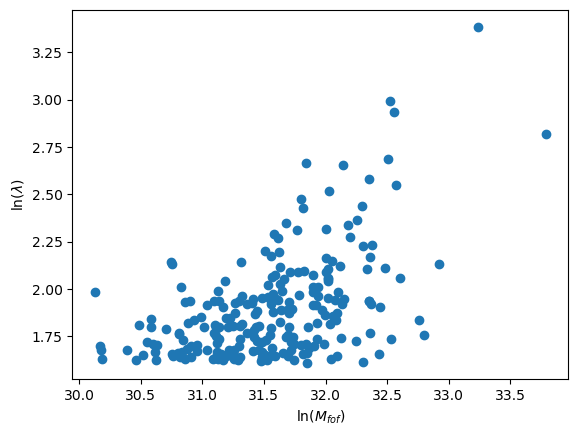

In [29]:
plt.scatter(np.log(halo_cat_bij['mass']),np.log(RM_cat_bij['mass']))
# plt.scatter(halo_cat_bij['mass_fof'],RM_cat_bij['richness'])

plt.xlabel('$\ln (M_{fof}$)')
plt.ylabel('$\ln (\lambda)$')
plt.show()




In [30]:
clevar_data = Table.read('/global/homes/c/cinlima/NumCosmo/notebooks/richness_proxy/CatalogsMatching/match_ID.fits')

# clevar_data

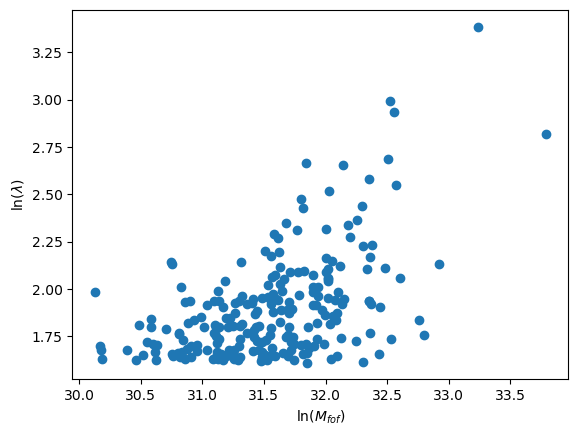

Text(0, 0.5, '$\\ln (\\lambda)$')

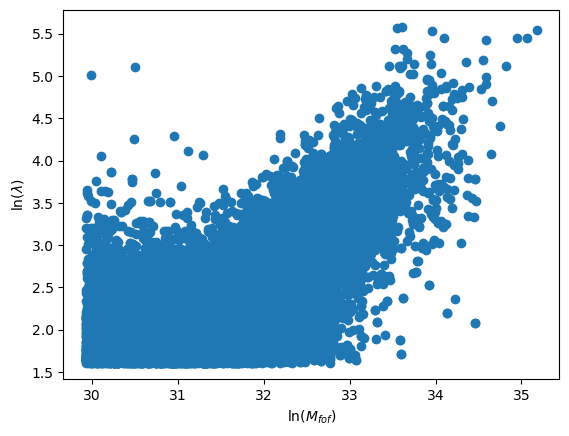

In [31]:
plt.scatter(np.log(halo_cat_bij['mass']),np.log(RM_cat_bij['mass']))
# plt.scatter(halo_cat_bij['mass_fof'],RM_cat_bij['richness'])

plt.xlabel('$\ln (M_{fof}$)')
plt.ylabel('$\ln (\lambda)$')
plt.show()


plt.scatter(np.log(clevar_data['halo_mass']),np.log(clevar_data['richness']))

plt.xlabel('$\ln (M_{fof}$)')
plt.ylabel('$\ln (\lambda)$')

In [32]:
#Table([halo_cat_bij['mass'], RM_cat_bij['mass'], RM_cat_bij['z']])
RM_cat